In [117]:
import json
import pandas as pd
from IPython.display import Image, JSON, display
from run_main import run
from helper_funcs import get_worm_json, write_worm_json

The strucure of an evolved model can be examined because all the parameters are stored in a readable JSON format configuration file. First, set the folder that contains the JSON file: 

In [131]:
origFolderName="notebooks/example_W2D18L"
outputFolderName=origFolderName + "_modified"

Load the JSON file. Every time a simulation or evoltution is performed the new evolved parameters and worm states are rewritten to the JSON file, which will therefore need to be reloaded: 

In [135]:
json_data = get_worm_json(origFolderName)

The JSON file contains all the worm parameters. The full expandable JSON can be examined. 

In [4]:
JSON(json_data)

<IPython.core.display.JSON object>

The "nervous_system" field contains several sub-fields.

In [5]:
pd.DataFrame({"nervous_system keys": json_data["nervous_system"].keys()})

,nervous_system keys
0,cell_names
1,cell_names_no_suffix
2,cells
3,chemical_conns
4,electrical_conns
5,model_name


The "cell_names" field contains the list of nervous system cells.

In [6]:
print(json_data['nervous_system']['cell_names']['value'])

['DB_0', 'DD_0', 'VBA_0', 'VDA_0', 'VBP_0', 'VDP_0', 'DB_1', 'DD_1', 'VBA_1', 'VDA_1', 'VBP_1', 'VDP_1', 'DB_2', 'DD_2', 'VBA_2', 'VDA_2', 'VBP_2', 'VDP_2', 'DB_3', 'DD_3', 'VBA_3', 'VDA_3', 'VBP_3', 'VDP_3', 'DB_4', 'DD_4', 'VBA_4', 'VDA_4', 'VBP_4', 'VDP_4', 'DB_5', 'DD_5', 'VBA_5', 'VDA_5', 'VBP_5', 'VDP_5', 'SMDD_0', 'RMDD_0', 'SMDV_0', 'RMDV_0']


The "chemical_conns" and "electrical_conns" fields contain the list of connections between nervous system cells.

In [7]:
print(json_data['nervous_system']['chemical_conns']['value'])

[{'from': 'DB_0', 'to': 'DB_0', 'weight': {'evotag': 5, 'value': -6.681587314056824}}, {'from': 'DD_0', 'to': 'DD_0', 'weight': {'evotag': 6, 'value': -2.8438626078194695}}, {'from': 'DB_0', 'to': 'DD_0', 'weight': {'evotag': 7, 'value': 2.289999938784325}}, {'from': 'VBA_0', 'to': 'DD_0', 'weight': {'evotag': 8, 'mfunc': {'f_ind': 1, 'fact': 0.5}, 'value': 3.7242620902827905}}, {'from': 'VBP_0', 'to': 'DD_0', 'weight': {'evotag': 8, 'mfunc': {'f_ind': 1, 'fact': 0.5}, 'value': 3.7242620902827905}}, {'from': 'VBA_0', 'to': 'VBA_0', 'weight': {'evotag': 5, 'value': -6.681587314056824}}, {'from': 'VDA_0', 'to': 'VDA_0', 'weight': {'evotag': 6, 'value': -2.8438626078194695}}, {'from': 'VBA_0', 'to': 'VDA_0', 'weight': {'evotag': 7, 'value': 2.289999938784325}}, {'from': 'DB_0', 'to': 'VDA_0', 'weight': {'evotag': 8, 'value': 7.448524180565581}}, {'from': 'DD_0', 'to': 'VDA_0', 'weight': {'evotag': 9, 'value': 14.734094612984334}}, {'from': 'VBP_0', 'to': 'VBP_0', 'weight': {'evotag': 5, '

Connections contain the "from" and "to" cells and the "weight" value. This particular connection also contains the "evotag" field which means its value is not fixed, but is to be optimized if the evolutionary algorithm is executed (see below.) This particular connection also contains the "mfunc" field. This allows a function (here a function indexed by f_ind) to be called on the value before it used to set up the worm simulation (see below.) 

In [120]:
print(json_data['nervous_system']['chemical_conns']['value'][3])

{'from': 'VBA_0', 'to': 'DD_0', 'weight': {'evotag': 8, 'mfunc': {'f_ind': 1, 'fact': 0.5}, 'value': 3.7242620902827905}}


The "nervous_system", "cells" field contains the parameters specific to the particular cell. The cell model used here has 'bias', 'gain' and 'tau' parameters. The initial value of the dynamical 'state' at the start of a simulation is also included. The "cell_class" is mainly used for plotting. The 'bias' parameter also includes the 'evotag' field meaning it is not fixed if an optimization is performed (see below.) 

In [121]:
print(json.dumps(json_data['nervous_system']['cells']['DB_0'], indent=2))

{
  "bias": {
    "evotag": 1,
    "value": 0.9188885838494046
  },
  "cell_class": {
    "value": "vnc"
  },
  "gain": {
    "value": 1.0
  },
  "state": {
    "value": 0.013888888888888888
  },
  "tau": {
    "evotag": 3,
    "value": 0.6390854137857667
  }
}


In [147]:
print(json.dumps(json_data['nervous_system']['cells']['VDA_1'], indent=2))

{
  "bias": {
    "evotag": 2,
    "value": -10.50067914566957
  },
  "cell_class": {
    "value": "vnc"
  },
  "gain": {
    "value": 1.0
  },
  "state": {
    "value": 0.2638888888888889
  },
  "tau": {
    "evotag": 4,
    "value": 0.6952001934027146
  }
}


Almost any parameter (only those with a 'value' field which is a number) can be changed. This can be done directly in the JSON configuration file or via helper python scripts which are used to modify the JSON configuration file. To do this we need to force the worm model to initialize from the JSON configuration file. This is done by setting the "modelName" paramter to "W2DSR". Here we also include an "inputFolderName". In this case the initial JSON configuration file will be loaded from that directory, while a new directory, "outputFolderName" will be generated for the output results.

In [158]:
args = dict(
    modelFolder="Worm2D", #folder containing the compiled C++ binary code
    modelName="W2DSR",#rerun using the generic json loaded model
    inputFolderName=origFolderName, #input folder
    outputFolderName=outputFolderName, #output folder
    overwrite=True, #allow overwrite of output folder 
    randInitState=False, #use fixed initial conditions from JSON file
    doTestRun=True, #run a single simple simulation
)

First, we can simply rerun the simulation using "W2DSR" potentially with different simulation parameters:

Directory 'notebooks/example_W2D18L_modified' already exists and the simulation results will be overwritten.
Parameter not found in worm_data.json
Parameter not found in worm_data.json
['Worm2D/main_osc', '--random_initial_state', '0', '--do_test_run', '1', '-R', '92108', '-p', '66', '-d', '50.0', '-t', '10.0', '--maxgens', '10', '-sd', '5', '-st', '0', '--doevol', '0', '-cpt', '1', '--dorandinit', '0', '--donml', '0', '--folder', 'notebooks/example_W2D18L_modified', '--modelname', 'W2DSR', '--domusc', '0', '-docpt', '1', '--evoType', 'Evo21']
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json

Loading activity data from: notebooks/example_W2D18L_modified/act.dat
Loading curvature data from: notebooks/example_W2D18L_modified/curv.dat
Loading body position data from: notebooks/example_W2D18L_modified/body.dat
Saved plot image to: notebooks/example_W2D

IndexError: index 180 is out of bounds for axis 0 with size 126

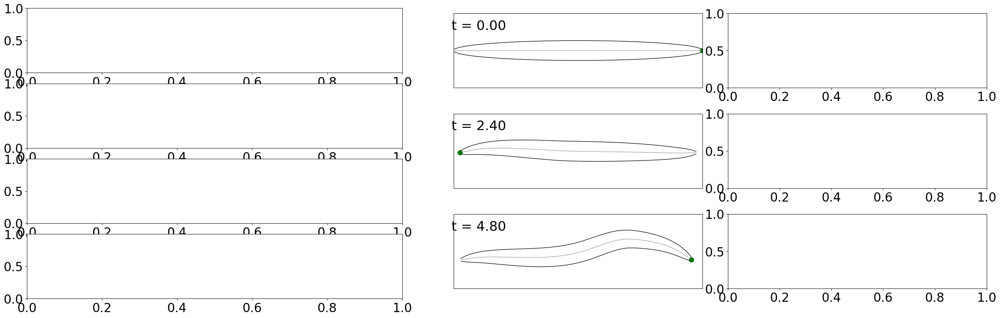

In [159]:
args['simduration']=5 #duration of simulation run
args['simtransient']=0 #transient of simulation run
args['doEvol'] = False #do not perform an optimization
run(**args) #the ExampleActivity.png and Motion.png figures must be reloaded above to see results
Image(filename=outputFolderName + '/ExampleActivity.png')

The model execution will overwrite the initial JSON file and some parts may be changed. Reload the new JSON configuration file after any execution is completed:

In [148]:
new_json_data = get_worm_json(outputFolderName)

In [153]:
print(json_data['nervous_system']['chemical_conns']['value'][3])
print(json.dumps(new_json_data['nervous_system']['cells']['VDA_1'], indent=2))

{'from': 'VBA_0', 'to': 'DD_0', 'weight': {'evotag': 8, 'mfunc': {'f_ind': 1, 'fact': 0.5}, 'value': 3.7242620902827905}}
{
  "bias": {
    "evotag": 2,
    "value": 5
  },
  "cell_class": {
    "value": "vnc"
  },
  "gain": {
    "value": 1.0
  },
  "state": {
    "value": 6
  },
  "tau": {
    "evotag": 4,
    "value": 6
  }
}


Change a particular parameter.(Note: if the parameter changed is one that is set to be 'optimizable' so that it has an 'evotag' parameter next to the value field, then any change made here will be immediately overwritten if a further optimization is performed) :

In [156]:
new_json_data['nervous_system']['cells']['VDA_1']['bias']['value'] = 5
new_json_data['nervous_system']['chemical_conns']['value'][3]['weight']['value']=0
print(new_json_data['nervous_system']['chemical_conns']['value'][3])
print(json.dumps(new_json_data['nervous_system']['cells']['VDA_1'], indent=2))

{'from': 'VBA_0', 'to': 'DD_0', 'weight': {'evotag': 8, 'mfunc': {'f_ind': 1, 'fact': 0.5}, 'value': 0}}
{
  "bias": {
    "evotag": 2,
    "value": 5
  },
  "cell_class": {
    "value": "vnc"
  },
  "gain": {
    "value": 1.0
  },
  "state": {
    "value": 6
  },
  "tau": {
    "evotag": 4,
    "value": 6
  }
}


The modified JSON needs to be re-saved to file before simulations are performed. To avoid changing the original JSON file, here we save the JSON configuration to the new output directory and make sure to unset the "inputFolderName" parameter so that simulations initialize from the new JSON (which will also subsequently be overwritten by the new simulation run).  

Directory 'notebooks/example_W2D18L_modified' already exists and the simulation results will be overwritten.
Parameter not found in worm_data.json
Parameter not found in worm_data.json
Simulation parameters are the same as the existing ones, but overwrite is true so the simulation will be rerun.
['Worm2D/main_osc', '--random_initial_state', '0', '--do_test_run', '1', '-R', '92108', '-p', '66', '-d', '50.0', '-t', '10.0', '--maxgens', '10', '-sd', '30', '-st', '20', '--doevol', '0', '-cpt', '1', '--dorandinit', '0', '--donml', '0', '--folder', 'notebooks/example_W2D18L_modified', '--modelname', 'W2DSR', '--domusc', '0', '-docpt', '1', '--evoType', 'Evo21']
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json

Loading activity data from: notebooks/example_W2D18L_modified/act.dat
Loading curvature data from: notebooks/example_W2D18L_modified/curv.dat
Load

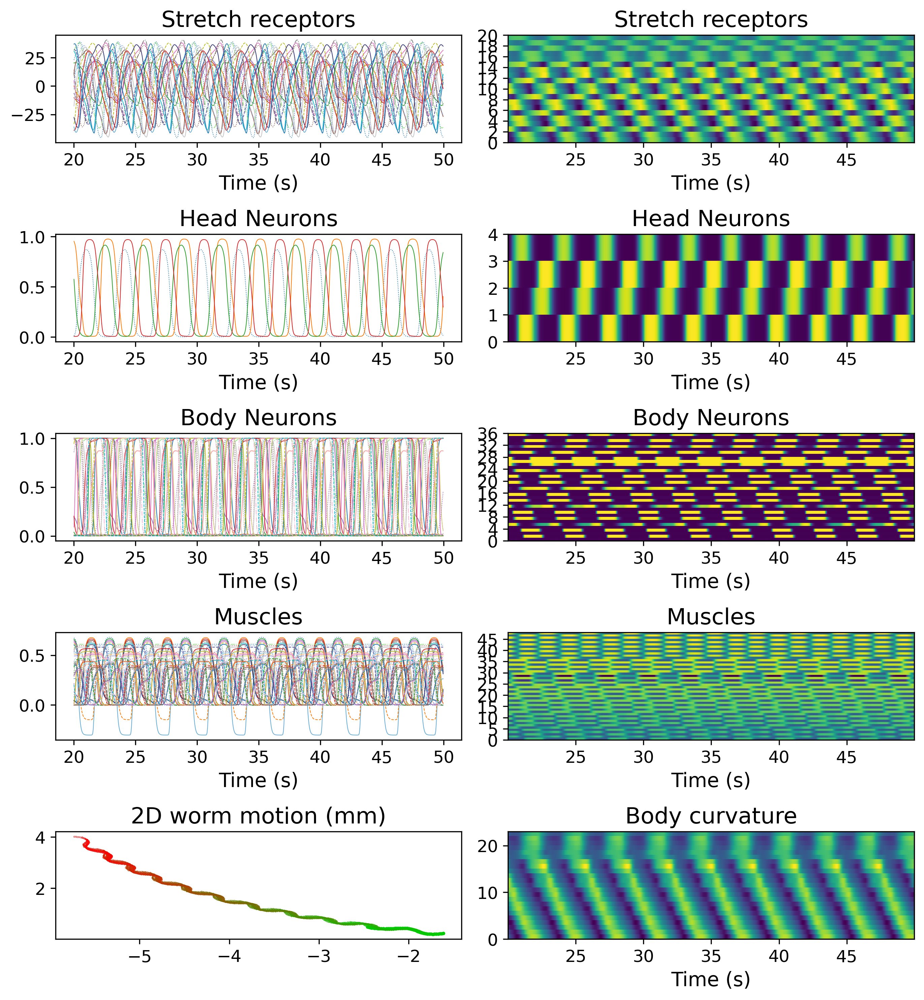

In [157]:
args['inputFolderName']=None
write_worm_json(outputFolderName, new_json_data)
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

Reload the new JSON file. Because no further evolution was performed, the parameters are unchanged:

In [130]:
new_json_data = get_worm_json(outputFolderName)
print(json.dumps(new_json_data['nervous_system']['cells']['VDA_1'], indent=2))

{
  "bias": {
    "evotag": 2,
    "value": -10.0
  },
  "cell_class": {
    "value": "vnc"
  },
  "gain": {
    "value": 1.0
  },
  "state": {
    "value": 6.0
  },
  "tau": {
    "evotag": 4,
    "value": 6.0
  }
}


In [22]:
JSON(new_json_data)

<IPython.core.display.JSON object>

The stretch receptors contain the weights to and from body segments and to and from the nervous sytem:

In [110]:
pd.DataFrame({"stretch receptor keys": new_json_data["stretch_receptor"].keys()})

,stretch receptor keys
0,d_weights
1,n_segs
2,n_stretch
3,ns_d_weights
4,ns_v_weights
5,plot_size
6,set_direct
7,sr_head_gain
8,sr_head_sr
9,sr_vnc_gain


Weights from body segments to dorsal stretch receptors:

In [12]:
print(json.dumps(new_json_data['stretch_receptor']['d_weights']))

{"message": "Weights from body segments to dorsal SR", "value": [{"from_seg": 7, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 8, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 9, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 10, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 11, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 12, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 13, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 14, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 15, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 16, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 17, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 18, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 19, "to_sr": 1, "weight": {"value": -9.16958372306238}}, {"from_seg": 20, "to_sr": 1,

Weights from dorsal stretch receptors to Nervous System:

In [111]:
print(json.dumps(new_json_data['stretch_receptor']['ns_d_weights']))

{"message": "Weights from dorsal SR to Nervous System", "value": [{"from_sr": 2, "to_ns": "DB_0", "weight": {"value": 1.0}}, {"from_sr": 3, "to_ns": "DB_1", "weight": {"value": 1.0}}, {"from_sr": 4, "to_ns": "DB_2", "weight": {"value": 1.0}}, {"from_sr": 5, "to_ns": "DB_3", "weight": {"value": 1.0}}, {"from_sr": 6, "to_ns": "DB_4", "weight": {"value": 1.0}}, {"from_sr": 7, "to_ns": "DB_5", "weight": {"value": 1.0}}, {"from_sr": 1, "to_ns": "SMDD_0", "weight": {"value": 1.0}}]}


Directly changing these stretch rececptor weight parameters will have no effect here because the stretch receptors here are of a certain type, 'SR18', which has a preconfigured connectivity which can be modified by only the four parameters:

In [116]:
print('set_direct: ' + json.dumps(new_json_data['stretch_receptor']['set_direct']))
print('type: ' + json.dumps(new_json_data['stretch_receptor']['type']))
print('sr_head_gain: '+ json.dumps(new_json_data['stretch_receptor']['sr_head_gain']))
print(json.dumps(new_json_data['stretch_receptor']['sr_vnc_gain']))
print(json.dumps(new_json_data['stretch_receptor']['sr_head_sr']))
print(json.dumps(new_json_data['stretch_receptor']['sr_vnc_sr']))

set_direct: {"value": true}
type: {"value": "SR18"}
sr_head_gain: {"evotag": 28, "value": -128.37417212287332}
{"evotag": 14, "value": -200}
{"value": true}
{"value": true}


Change one of these parameters and rerun the simulation:

In [114]:
new_json_data['stretch_receptor']['sr_vnc_gain']['value']=-200
print(json.dumps(new_json_data['stretch_receptor']['sr_vnc_gain']))

{"evotag": 14, "value": -200}


Directory 'notebooks/example_W2D18L_modified' already exists and the simulation results will be overwritten.
Parameter not found in worm_data.json
Parameter not found in worm_data.json
Simulation parameters are the same as the existing ones, but overwrite is true so the simulation will be rerun.
['Worm2D/main_osc', '--random_initial_state', '0', '--do_test_run', '1', '-R', '92108', '-p', '66', '-d', '50.0', '-t', '10.0', '--maxgens', '10', '-sd', '20', '-st', '10', '--doevol', '0', '-cpt', '1', '--dorandinit', '0', '--donml', '0', '--folder', 'notebooks/example_W2D18L_modified', '--modelname', 'W2DSR', '--domusc', '0', '-docpt', '1', '--evoType', 'Evo21']
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json

Loading activity data from: notebooks/example_W2D18L_modified/act.dat
Loading curvature data from: notebooks/example_W2D18L_modified/curv.dat
Load

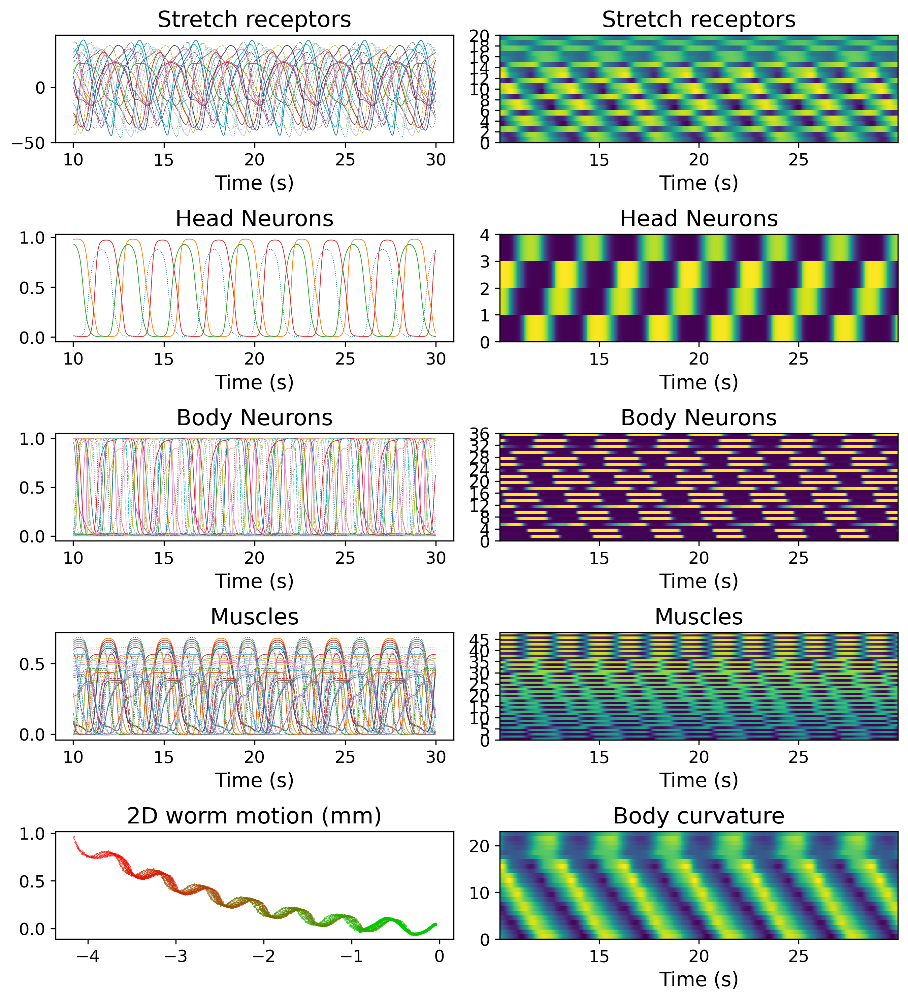

In [115]:
args['inputFolderName']=None
write_worm_json(outputFolderName, new_json_data)
args['simduration']=20 #duration of simulation run
args['simtransient']=10 #transient of simulation run
args['doEvol'] = False #do not perform an optimization
run(**args) #the ExampleActivity.png and Motion.png figures must be reloaded above to see results
Image(filename=outputFolderName + '/ExampleActivity.png')

In [86]:
print(json.dumps(new_json_data['stretch_receptor']['d_weights']['value'][3]))
new_json_data['stretch_receptor']['d_weights']['value'][3]['weight']['value']=3
print(json.dumps(new_json_data['stretch_receptor']['d_weights']['value'][3]))

{"from_seg": 10, "to_sr": 1, "weight": {"value": -9.16958372306238}}
{"from_seg": 10, "to_sr": 1, "weight": {"value": 3}}


Although the simulation was not evolved and the value set was not evolvable anyway, the value change has not affected the simulation and is not set in the JSON after the simulation is performed:

Although the simulation was not evolved and the value set was not evolvable anyway, the value change has not affected the simulation and is not set in the JSON after the simulation is performed:

In [93]:
new_json_data = get_worm_json(outputFolderName)
print(json.dumps(new_json_data['stretch_receptor']['d_weights']['value'][3]))

{"from_seg": 10, "to_sr": 1, "weight": {"value": -9.16958372306238}}


This is because the stretch_receptor was code generated from the parameters, "sr_head_gain" and "sr_vnc_gain". To force the stretch receptor to load from its full parameters we set the field, "set_direct" to true:

In [94]:
print(json.dumps(new_json_data['stretch_receptor']['set_direct']))
new_json_data['stretch_receptor']['set_direct']['value']= True
new_json_data['stretch_receptor']['d_weights']['value'][3]['weight']['value']=3
print(json.dumps(new_json_data['stretch_receptor']['set_direct']))
print(json.dumps(new_json_data['stretch_receptor']['d_weights']['value'][3]))

{"value": false}
{"value": true}
{"from_seg": 10, "to_sr": 1, "weight": {"value": 3}}


In [95]:
args['inputFolderName']=None
write_worm_json(outputFolderName, new_json_data)
run(**args)

Directory 'notebooks/example_W2D18L_modified' already exists and the simulation results will be overwritten.
Parameter not found in worm_data.json
Parameter not found in worm_data.json
Simulation parameters are the same as the existing ones, but overwrite is true so the simulation will be rerun.
['Worm2D/main_osc', '--random_initial_state', '0', '--do_test_run', '1', '-R', '92108', '-p', '66', '-d', '50.0', '-t', '10.0', '--maxgens', '10', '-sd', '20', '-st', '10', '--doevol', '0', '-cpt', '1', '--dorandinit', '0', '--donml', '0', '--folder', 'notebooks/example_W2D18L_modified', '--modelname', 'W2DSR', '--domusc', '0', '-docpt', '1', '--evoType', 'Evo21']
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json

Loading activity data from: notebooks/example_W2D18L_modified/act.dat
Loading curvature data from: notebooks/example_W2D18L_modified/curv.dat
Load

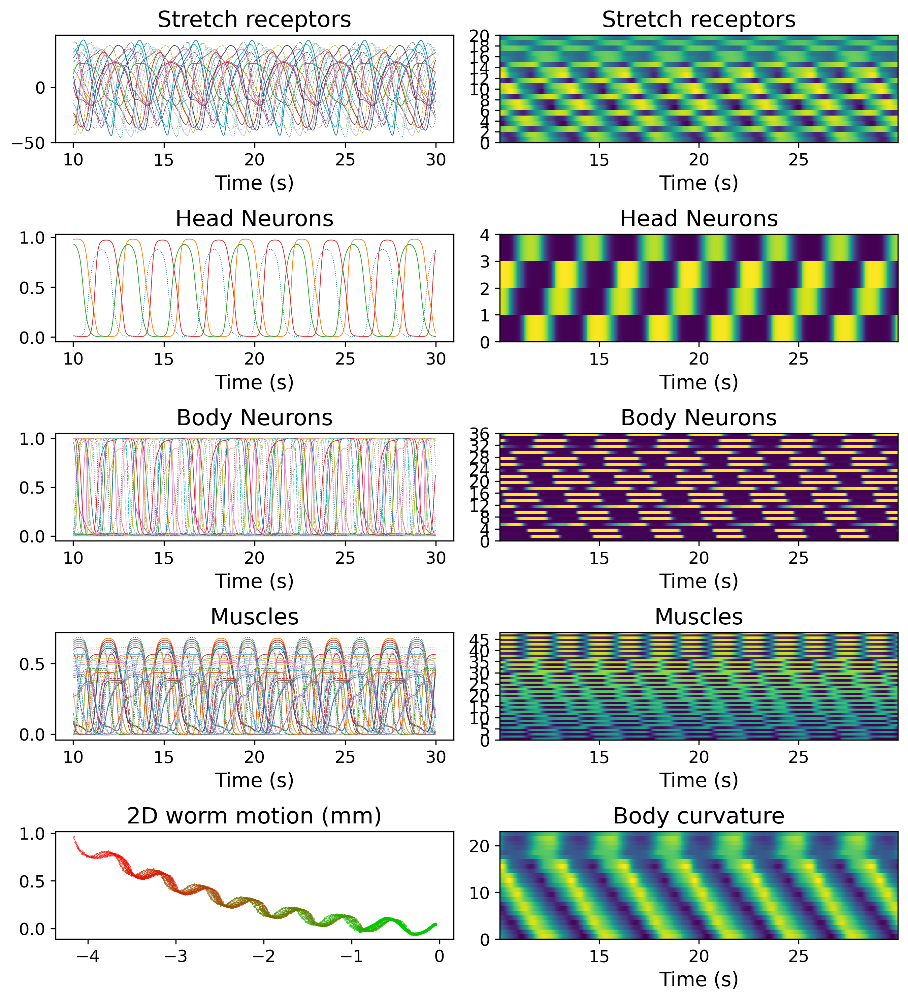

In [96]:
Image(filename=outputFolderName + '/ExampleActivity.png')

In [97]:
new_json_data = get_worm_json(outputFolderName)
print(json.dumps(new_json_data['stretch_receptor']['d_weights']['value'][3]))
print(json.dumps(new_json_data['stretch_receptor']['set_direct']['value']))

{"from_seg": 10, "to_sr": 1, "weight": {"value": 3.0}}
true


The weights from the nervous system to the dorsal muscles are in the 'dorsal_nmj'.

In [98]:
print(json.dumps(new_json_data['dorsal_nmj']))

{"weights": {"message": "Dorsal NMJ weights in sparse format", "value": [{"from_cell": "SMDD_0", "to_musc": 1, "weight": {"value": 0.062101899013920873}}, {"from_cell": "RMDD_0", "to_musc": 1, "weight": {"value": 0.7}}, {"from_cell": "SMDD_0", "to_musc": 2, "weight": {"value": 0.060808109451130854}}, {"from_cell": "RMDD_0", "to_musc": 2, "weight": {"value": 0.6854166666666666}}, {"from_cell": "SMDD_0", "to_musc": 3, "weight": {"value": 0.05951431988834084}}, {"from_cell": "RMDD_0", "to_musc": 3, "weight": {"value": 0.6708333333333333}}, {"from_cell": "SMDD_0", "to_musc": 4, "weight": {"value": 0.05822053032555083}}, {"from_cell": "RMDD_0", "to_musc": 4, "weight": {"value": 0.65625}}, {"from_cell": "SMDD_0", "to_musc": 5, "weight": {"value": 0.0569267407627608}}, {"from_cell": "RMDD_0", "to_musc": 5, "weight": {"value": 0.6416666666666666}}, {"from_cell": "SMDD_0", "to_musc": 6, "weight": {"value": 0.05563295119997079}}, {"from_cell": "RMDD_0", "to_musc": 6, "weight": {"value": 0.627083

These can also be set:

In [100]:
print(json.dumps(new_json_data['dorsal_nmj']['weights']['value'][6]))
new_json_data['dorsal_nmj']['weights']['value'][6]['weight']['value']=5
print(json.dumps(new_json_data['dorsal_nmj']['weights']['value'][6]))

{"from_cell": "SMDD_0", "to_musc": 4, "weight": {"value": 0.05822053032555083}}
{"from_cell": "SMDD_0", "to_musc": 4, "weight": {"value": 5}}


Directory 'notebooks/example_W2D18L_modified' already exists and the simulation results will be overwritten.
Parameter not found in worm_data.json
Parameter not found in worm_data.json
Simulation parameters are the same as the existing ones, but overwrite is true so the simulation will be rerun.
['Worm2D/main_osc', '--random_initial_state', '0', '--do_test_run', '1', '-R', '92108', '-p', '66', '-d', '50.0', '-t', '10.0', '--maxgens', '10', '-sd', '20', '-st', '10', '--doevol', '0', '-cpt', '1', '--dorandinit', '0', '--donml', '0', '--folder', 'notebooks/example_W2D18L_modified', '--modelname', 'W2DSR', '--domusc', '0', '-docpt', '1', '--evoType', 'Evo21']
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json
jsonfile notebooks/example_W2D18L_modified/worm_data_worm.json

Loading activity data from: notebooks/example_W2D18L_modified/act.dat
Loading curvature data from: notebooks/example_W2D18L_modified/curv.dat
Load

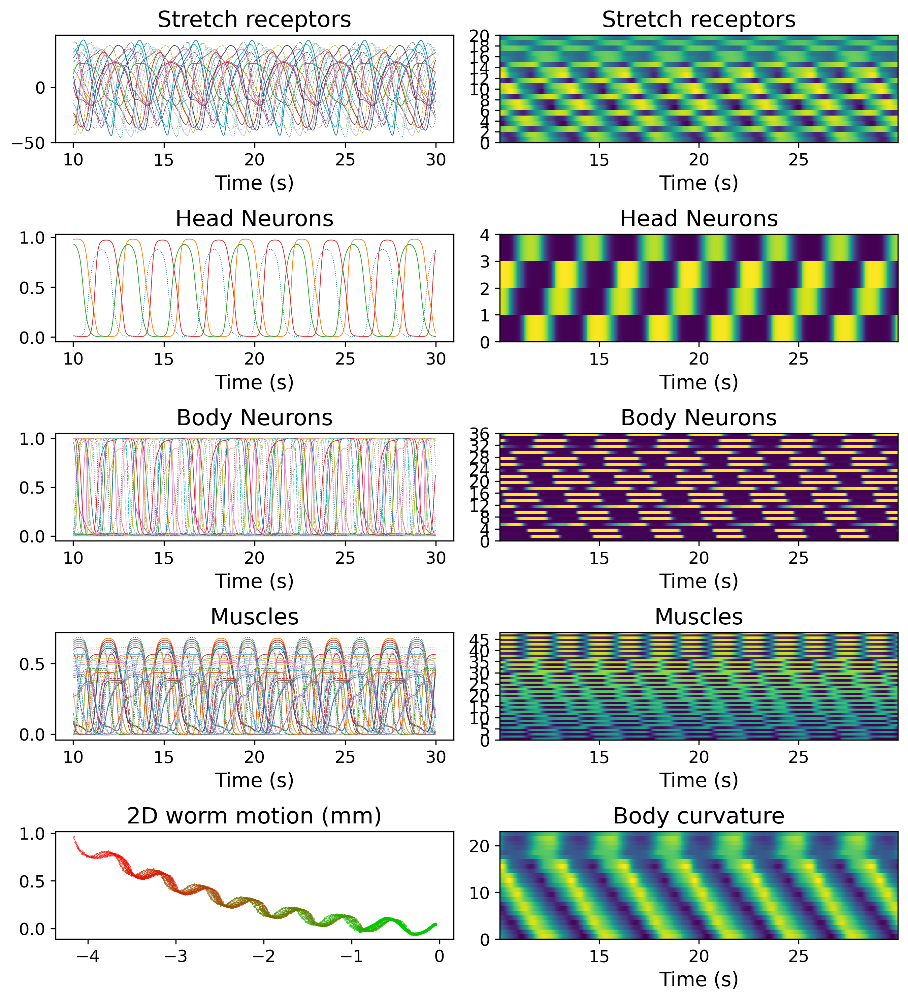

In [101]:
args['inputFolderName']=None
write_worm_json(outputFolderName, new_json_data)
run(**args)
Image(filename=outputFolderName + '/ExampleActivity.png')

In this case too, the change in value has had no effect and has been overwritten:

In [102]:
new_json_data = get_worm_json(outputFolderName)
print(json.dumps(new_json_data['dorsal_nmj']['weights']['value'][6]))

{"from_cell": "SMDD_0", "to_musc": 4, "weight": {"value": 0.05822053032555083}}


This because the muscle connectivity is also generated by the 'vnc_18' object:

In [103]:
print(json.dumps(new_json_data['vnc_18']))

{"dorsal_conns": {"DB": {"cell_ind": 1, "weight": {"evotag": 15, "value": 1.0}}, "DD": {"cell_ind": 2, "weight": {"evotag": 16, "value": -0.5335433061294691}}, "RMDD": {"cell_ind": 38, "weight": {"evotag": 30, "value": 1.0}}, "SMDD": {"cell_ind": 37, "weight": {"evotag": 29, "value": 0.08871699859131554}}}, "gain_fact": {"value": 0.7}, "gain_map_d": {"value": 0.5}, "gain_map_v": {"value": 0.5}, "set_from_this": {"value": true}, "ventral_conns": {"RMDV": {"cell_ind": 40, "weight": {"evotag": 30, "value": 1.0}}, "SMDV": {"cell_ind": 39, "weight": {"evotag": 29, "value": 0.08871699859131554}}, "VBA": {"cell_ind": 3, "weight": {"evotag": 15, "value": 1.0}}, "VBP": {"cell_ind": 5, "weight": {"evotag": 15, "value": 1.0}}, "VDA": {"cell_ind": 4, "weight": {"evotag": 16, "value": -0.5335433061294691}}, "VDP": {"cell_ind": 6, "weight": {"evotag": 16, "value": -0.5335433061294691}}}}
